In [1]:
!pip install -q segmentation-models-pytorch albumentations

import os
import time
from glob import glob
from tqdm import tqdm

import cv2
import numpy as np
import pandas as pd
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import albumentations as A
from scipy.ndimage.morphology import binary_dilation
import segmentation_models_pytorch as smp
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split

import torch
from torch.optim import Adam
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms as T

/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 2.0.5 (you have 1.4.17). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/tmp/ipykernel_30/2608534261.py:14: DeprecationWarning: Please import `binary_dilation` from the `scipy.ndimage` namespace; the `scipy.ndimage.morphology` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.morphology import binary_dilation


In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

Device: cuda


In [3]:
files_dir = '/kaggle/input/lgg-mri-segmentation/kaggle_3m'
file_paths = glob(f'{files_dir}/*/*[0-9].tif')
file_paths[:10]

['/kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_45.tif',
 '/kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_57.tif',
 '/kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_33.tif',
 '/kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_27.tif',
 '/kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_52.tif',
 '/kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_10.tif',
 '/kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_29.tif',
 '/kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_56.tif',
 '/kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_24.tif',
 '/kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_9.tif']

In [4]:
def get_file_row(path):
    """Produces ID of a patient, image and mask filenames from a particular path"""
    path_no_ext, ext = os.path.splitext(path)
    filename = os.path.basename(path)
    
    patient_id = '_'.join(filename.split('_')[:3]) # Patient ID in the csv file consists ofTCGA_DU_7010_19860307_45.tif' 3 first filename segments
    
    return [patient_id, path, f'{path_no_ext}_mask{ext}']

In [5]:
filenames_df = pd.DataFrame((get_file_row(filename) for filename in file_paths), columns=['Patient', 'image_filename', 'mask_filename'])
filenames_df.head()

,Patient,image_filename,mask_filename
0,TCGA_DU_7010,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...
1,TCGA_DU_7010,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...
2,TCGA_DU_7010,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...
3,TCGA_DU_7010,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...
4,TCGA_DU_7010,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...


In [6]:
class MriDataset(Dataset):
    def __init__(self, df, transform=None, mean=0.5, std=0.25):
        super(MriDataset, self).__init__()
        self.df = df
        self.transform = transform
        self.mean = mean
        self.std = std
        
        
    def __len__(self):
        return len(self.df)
        
    def __getitem__(self, idx, raw=False):
        row = self.df.iloc[idx]
        img = cv2.imread(row['image_filename'], cv2.IMREAD_UNCHANGED)
        mask = cv2.imread(row['mask_filename'], cv2.IMREAD_GRAYSCALE)
        if raw:
            return img, mask
        
        if self.transform:
            augmented = self.transform(image=img, mask=mask)
            image, mask = augmented['image'], augmented['mask']
        
        img = T.functional.to_tensor(img)
        mask = mask // 255
        mask = torch.Tensor(mask)
        return img, mask

In [7]:
train_df, test_df = train_test_split(filenames_df, test_size=0.2)
test_df, valid_df = train_test_split(test_df, test_size=0.2)

train_df.head()

,Patient,image_filename,mask_filename
1001,TCGA_FG_7643,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...
2153,TCGA_HT_7874,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...
3137,TCGA_HT_8107,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...
1825,TCGA_CS_4942,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...
2856,TCGA_FG_A4MU,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...


In [8]:
transform = A.Compose([
    A.ChannelDropout(p=0.3),
    A.RandomBrightnessContrast(p=0.3),
    A.ColorJitter(p=0.3),
])

train_dataset = MriDataset(train_df, transform)
valid_dataset = MriDataset(valid_df)
test_dataset = MriDataset(test_df)

In [20]:
batch_size = 64

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=1)

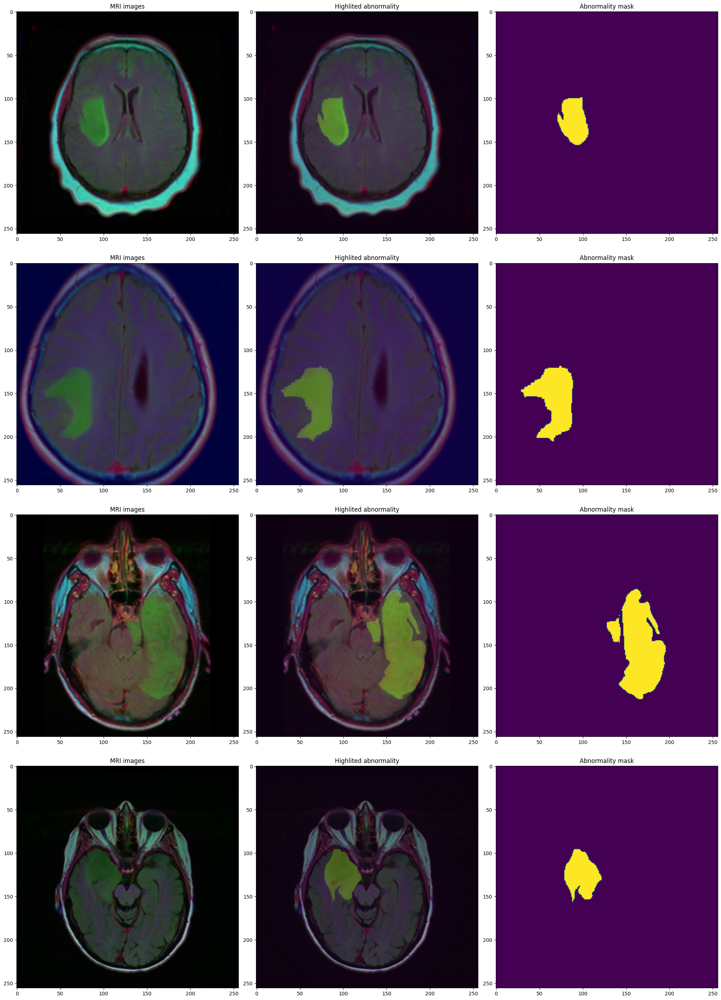

In [21]:
%matplotlib inline
n_examples = 4

fig, axs = plt.subplots(n_examples, 3, figsize=(20, n_examples*7), constrained_layout=True)
i = 0
for ax in axs:
    while True:
        image, mask = train_dataset.__getitem__(i, raw=True)
        i += 1
        if np.any(mask): 
            ax[0].set_title("MRI images")
            ax[0].imshow(image)
            ax[1].set_title("Highlited abnormality")
            ax[1].imshow(image)
            ax[1].imshow(mask, alpha=0.2)
            
            ax[2].imshow(mask)
            ax[2].set_title("Abnormality mask")
            break
        
    
    

In [22]:
class EarlyStopping():
    """
    Stops training when loss stops decreasing in a PyTorch module.
    """
    def __init__(self, patience:int = 6, min_delta: float = 0, weights_path: str = 'weights.pt'):
        """
        :param patience: number of epochs of non-decreasing loss before stopping
        :param min_delta: minimum difference between best and new loss that is considered
            an improvement
        :paran weights_path: Path to the file that should store the model's weights
        """
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = float('inf')
        self.weights_path = weights_path

    def __call__(self, val_loss: float, model: torch.nn.Module):
        if self.best_loss - val_loss > self.min_delta:
            self.best_loss = val_loss
            torch.save(model.state_dict(), self.weights_path)
            self.counter = 0
        else:
            self.counter += 1
            if self.counter >= self.patience:
                return True
        return False

    def load_weights(self, model: torch.nn.Module):
        """
        Loads weights of the best model.
        :param model: model to which the weigths should be loaded
        """
        return model.load_state_dict(torch.load(self.weights_path))
            

In [23]:
# ------------------------------
# Metrics - (IOU and Dice Coeff)
# ------------------------------
def iou_pytorch(predictions: torch.Tensor, labels: torch.Tensor, e: float = 1e-7):
    """Calculates Intersection over Union for a tensor of predictions"""
    predictions = torch.where(predictions > 0.5, 1, 0)
    labels = labels.byte()
    
    intersection = (predictions & labels).float().sum((1, 2))
    union = (predictions | labels).float().sum((1, 2))
    
    iou = (intersection + e) / (union + e)
    return iou

def dice_pytorch(predictions: torch.Tensor, labels: torch.Tensor, e: float = 1e-7):
    """Calculates Dice coefficient for a tensor of predictions"""
    predictions = torch.where(predictions > 0.5, 1, 0)
    labels = labels.byte()
    
    intersection = (predictions & labels).float().sum((1, 2))
    return ((2 * intersection) + e) / (predictions.float().sum((1, 2)) + labels.float().sum((1, 2)) + e)

In [24]:
# ------------------------------
# Loss Function - BCE + Dice Loss
# ------------------------------

def BCE_dice(output, target, alpha=0.01):
    bce = torch.nn.functional.binary_cross_entropy(output, target)
    soft_dice = 1 - dice_pytorch(output, target).mean()
    return bce + alpha * soft_dice

In [25]:
model = torch.hub.load('mateuszbuda/brain-segmentation-pytorch', 'unet',
    in_channels=3, out_channels=1, init_features=32, pretrained=True).to(device)

Using cache found in /root/.cache/torch/hub/mateuszbuda_brain-segmentation-pytorch_master


In [26]:
def training_loop(epochs, model, train_loader, valid_loader, optimizer, loss_fn, lr_scheduler):
    history = {'train_loss': [], 'val_loss': [], 'val_IoU': [], 'val_dice': []}
    early_stopping = EarlyStopping(patience=7)
    
    for epoch in range(1, epochs + 1):
        start_time = time.time()
        
        running_loss = 0
        model.train()
        for i, data in enumerate(tqdm(train_loader)):
            img, mask = data
            img, mask = img.to(device), mask.to(device)
            predictions = model(img)
            predictions = predictions.squeeze(1)
            loss = loss_fn(predictions, mask)
            running_loss += loss.item() * img.size(0)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
        
        model.eval()
        with torch.no_grad():
            running_IoU = 0
            running_dice = 0
            running_valid_loss = 0
            for i, data in enumerate(valid_loader):
                img, mask = data
                img, mask = img.to(device), mask.to(device)
                predictions = model(img)
                predictions = predictions.squeeze(1)
                running_dice += dice_pytorch(predictions, mask).sum().item()
                running_IoU += iou_pytorch(predictions, mask).sum().item()
                loss = loss_fn(predictions, mask)
                running_valid_loss += loss.item() * img.size(0)
        train_loss = running_loss / len(train_loader.dataset)
        val_loss = running_valid_loss / len(valid_loader.dataset)
        val_dice = running_dice / len(valid_loader.dataset)
        val_IoU = running_IoU / len(valid_loader.dataset)
        
        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        history['val_IoU'].append(val_IoU)
        history['val_dice'].append(val_dice)
        print(f'Epoch: {epoch}/{epochs} | Training loss: {train_loss} | Validation loss: {val_loss} | Validation Mean IoU: {val_IoU} '
         f'| Validation Dice coefficient: {val_dice}')
        
        lr_scheduler.step(val_loss)
        if early_stopping(val_loss, model):
            early_stopping.load_weights(model)
            break
    model.eval()
    return history

In [27]:
loss_fn = BCE_dice
optimizer = Adam(model.parameters(), lr=0.001)
epochs = 60
lr_scheduler = ReduceLROnPlateau(optimizer=optimizer, patience=2,factor=0.2)

history = training_loop(epochs, model, train_loader, valid_loader, optimizer, loss_fn, lr_scheduler)

100%|██████████| 50/50 [00:56<00:00,  1.13s/it]


Epoch: 1/60 | Training loss: 0.048986600799058755 | Validation loss: 0.02760898300646981 | Validation Mean IoU: 0.6499427843697464 | Validation Dice coefficient: 0.6835522712031498


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 2/60 | Training loss: 0.021449427030603672 | Validation loss: 0.02232560520119305 | Validation Mean IoU: 0.7238333255429811 | Validation Dice coefficient: 0.7564885344686387


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 3/60 | Training loss: 0.016423471861068815 | Validation loss: 0.018520109343660784 | Validation Mean IoU: 0.732350144205214 | Validation Dice coefficient: 0.7687809376776973


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 4/60 | Training loss: 0.014736646587207481 | Validation loss: 0.013469577873054939 | Validation Mean IoU: 0.7556853234013424 | Validation Dice coefficient: 0.79177937326552


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 5/60 | Training loss: 0.013391308510166955 | Validation loss: 0.016248310644981227 | Validation Mean IoU: 0.6962886762015427 | Validation Dice coefficient: 0.731692157214201


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 6/60 | Training loss: 0.012560794759640127 | Validation loss: 0.012954933521679686 | Validation Mean IoU: 0.7958719760556764 | Validation Dice coefficient: 0.8320850541320028


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 7/60 | Training loss: 0.010700055196255474 | Validation loss: 0.024326045018962666 | Validation Mean IoU: 0.6775687012491347 | Validation Dice coefficient: 0.726706637611872


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 8/60 | Training loss: 0.010633758338884757 | Validation loss: 0.010178341176596623 | Validation Mean IoU: 0.8041107805469369 | Validation Dice coefficient: 0.8465829559519321


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 9/60 | Training loss: 0.010271573156999045 | Validation loss: 0.01450553145023841 | Validation Mean IoU: 0.7842229891426956 | Validation Dice coefficient: 0.8286450905135915


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 10/60 | Training loss: 0.008506732752218943 | Validation loss: 0.008986367855834055 | Validation Mean IoU: 0.8397885334642627 | Validation Dice coefficient: 0.8797844753989691


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 11/60 | Training loss: 0.010422593348600608 | Validation loss: 0.010948326108576377 | Validation Mean IoU: 0.8355661585361143 | Validation Dice coefficient: 0.8771635007254684


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 12/60 | Training loss: 0.008934020628365047 | Validation loss: 0.011449985724838473 | Validation Mean IoU: 0.8178665305994735 | Validation Dice coefficient: 0.8543880438502831


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 13/60 | Training loss: 0.007775997880797666 | Validation loss: 0.009082433879611235 | Validation Mean IoU: 0.8568223639379574 | Validation Dice coefficient: 0.8945610432685176


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 14/60 | Training loss: 0.006596424056687032 | Validation loss: 0.0062880658285244355 | Validation Mean IoU: 0.8909984902490543 | Validation Dice coefficient: 0.9257553438597088


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 15/60 | Training loss: 0.006278675253779488 | Validation loss: 0.006062241330082658 | Validation Mean IoU: 0.9029214593428599 | Validation Dice coefficient: 0.9378306714794303


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 16/60 | Training loss: 0.005898220434066618 | Validation loss: 0.006024101731379198 | Validation Mean IoU: 0.9016697557666634 | Validation Dice coefficient: 0.9355415633962124


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 17/60 | Training loss: 0.005757119089976602 | Validation loss: 0.005951076869770319 | Validation Mean IoU: 0.89563902118538 | Validation Dice coefficient: 0.9290418745596197


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 18/60 | Training loss: 0.006099132519091485 | Validation loss: 0.006647543380437772 | Validation Mean IoU: 0.8975809314582921 | Validation Dice coefficient: 0.9334122742278667


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 19/60 | Training loss: 0.0055323286616722565 | Validation loss: 0.005897720591931404 | Validation Mean IoU: 0.9087676036206982 | Validation Dice coefficient: 0.9420296632790868


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 20/60 | Training loss: 0.005516877109875279 | Validation loss: 0.005923623513854757 | Validation Mean IoU: 0.9024152272864233 | Validation Dice coefficient: 0.9356429184539409


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 21/60 | Training loss: 0.00544215295809898 | Validation loss: 0.005926896576309884 | Validation Mean IoU: 0.9041284488726266 | Validation Dice coefficient: 0.9374365987656992


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 22/60 | Training loss: 0.005448932485963712 | Validation loss: 0.005887448044988928 | Validation Mean IoU: 0.9013944456848917 | Validation Dice coefficient: 0.9346703638004351


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 23/60 | Training loss: 0.005140290867905878 | Validation loss: 0.0069207166545564615 | Validation Mean IoU: 0.8640751174733609 | Validation Dice coefficient: 0.8987342134306703


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 24/60 | Training loss: 0.005346406996057547 | Validation loss: 0.005717938671572299 | Validation Mean IoU: 0.9090489737595184 | Validation Dice coefficient: 0.9419540936433817


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 25/60 | Training loss: 0.0049721135932986535 | Validation loss: 0.0058208299989375885 | Validation Mean IoU: 0.9032858112190343 | Validation Dice coefficient: 0.9358995172041881


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 26/60 | Training loss: 0.004853659294482831 | Validation loss: 0.005836790333254428 | Validation Mean IoU: 0.904011521158339 | Validation Dice coefficient: 0.9364699955228009


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 27/60 | Training loss: 0.004726044338811669 | Validation loss: 0.0058285977243434026 | Validation Mean IoU: 0.89517815505402 | Validation Dice coefficient: 0.9266462446768072


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 28/60 | Training loss: 0.004424726637184023 | Validation loss: 0.005519980900696939 | Validation Mean IoU: 0.9127478539189205 | Validation Dice coefficient: 0.9444785057743893


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 29/60 | Training loss: 0.004332521495122179 | Validation loss: 0.005486242526175478 | Validation Mean IoU: 0.9123666014852403 | Validation Dice coefficient: 0.9441738973689985


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 30/60 | Training loss: 0.004272372807360382 | Validation loss: 0.005506417283764746 | Validation Mean IoU: 0.9117664626882046 | Validation Dice coefficient: 0.9436527566064762


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 31/60 | Training loss: 0.004265484964280059 | Validation loss: 0.005449851467922519 | Validation Mean IoU: 0.9121904735323749 | Validation Dice coefficient: 0.9440068353580523


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 32/60 | Training loss: 0.00426598592026315 | Validation loss: 0.005642844523197111 | Validation Mean IoU: 0.9086722120454039 | Validation Dice coefficient: 0.9411604676065566


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 33/60 | Training loss: 0.0041928002919712545 | Validation loss: 0.005594191819287931 | Validation Mean IoU: 0.9087675191179106 | Validation Dice coefficient: 0.9410910063152071


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 34/60 | Training loss: 0.004240532472197499 | Validation loss: 0.005376858318436749 | Validation Mean IoU: 0.9132158544999135 | Validation Dice coefficient: 0.9445991998986353


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 35/60 | Training loss: 0.0041315994932008965 | Validation loss: 0.0054243970013966285 | Validation Mean IoU: 0.9123352871665472 | Validation Dice coefficient: 0.9437764807592465


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 36/60 | Training loss: 0.004105042178163644 | Validation loss: 0.005439746500099007 | Validation Mean IoU: 0.9133311766612379 | Validation Dice coefficient: 0.944887438906899


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 37/60 | Training loss: 0.00411035188188112 | Validation loss: 0.0054507485496564 | Validation Mean IoU: 0.9131149098842959 | Validation Dice coefficient: 0.9445652056343948


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 38/60 | Training loss: 0.0040203177210416455 | Validation loss: 0.005393829167219279 | Validation Mean IoU: 0.9131697642652294 | Validation Dice coefficient: 0.9445402169529395


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 39/60 | Training loss: 0.003996899100497597 | Validation loss: 0.0054031367048243935 | Validation Mean IoU: 0.9133212536196166 | Validation Dice coefficient: 0.9446395198001137


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 40/60 | Training loss: 0.0039841535565556824 | Validation loss: 0.005361470305419798 | Validation Mean IoU: 0.915763263460956 | Validation Dice coefficient: 0.9465461803387992


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 41/60 | Training loss: 0.003974170248328483 | Validation loss: 0.005389619760120971 | Validation Mean IoU: 0.9137716534771497 | Validation Dice coefficient: 0.9450820850420601


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 42/60 | Training loss: 0.003993052318532197 | Validation loss: 0.005373946249579327 | Validation Mean IoU: 0.9146119009090375 | Validation Dice coefficient: 0.9457076833217959


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 43/60 | Training loss: 0.003998637958120103 | Validation loss: 0.00537500416129073 | Validation Mean IoU: 0.9141809970517701 | Validation Dice coefficient: 0.945385027535354


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 44/60 | Training loss: 0.003955922577772533 | Validation loss: 0.0053544750767229475 | Validation Mean IoU: 0.9153380092186264 | Validation Dice coefficient: 0.9462190821200986


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 45/60 | Training loss: 0.003964447774315407 | Validation loss: 0.005396700051577785 | Validation Mean IoU: 0.9134257594241372 | Validation Dice coefficient: 0.9448070043249975


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 46/60 | Training loss: 0.00395200419442084 | Validation loss: 0.005382305459131168 | Validation Mean IoU: 0.9138634597198873 | Validation Dice coefficient: 0.9451086189173445


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 47/60 | Training loss: 0.003961693915836881 | Validation loss: 0.005381382105848457 | Validation Mean IoU: 0.9135787939723534 | Validation Dice coefficient: 0.9449287124826938


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 48/60 | Training loss: 0.003969670271141217 | Validation loss: 0.0053722396422224705 | Validation Mean IoU: 0.9141577950006798 | Validation Dice coefficient: 0.9453824200207674


100%|██████████| 50/50 [00:30<00:00,  1.65it/s]


Epoch: 49/60 | Training loss: 0.003943466024551537 | Validation loss: 0.005381157704263549 | Validation Mean IoU: 0.9141176923920836 | Validation Dice coefficient: 0.9453091923194595


100%|██████████| 50/50 [00:30<00:00,  1.65it/s]


Epoch: 50/60 | Training loss: 0.003986444499229848 | Validation loss: 0.005366167189152558 | Validation Mean IoU: 0.9149275188204609 | Validation Dice coefficient: 0.9459491198575949


100%|██████████| 50/50 [00:29<00:00,  1.67it/s]


Epoch: 51/60 | Training loss: 0.003936370251557458 | Validation loss: 0.0053387504023841665 | Validation Mean IoU: 0.915321482887751 | Validation Dice coefficient: 0.9462281239183643


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 52/60 | Training loss: 0.003948647026037795 | Validation loss: 0.005372354135954682 | Validation Mean IoU: 0.9144687531869623 | Validation Dice coefficient: 0.9456012460249889


100%|██████████| 50/50 [00:29<00:00,  1.69it/s]


Epoch: 53/60 | Training loss: 0.0039733237962644745 | Validation loss: 0.005419075748399843 | Validation Mean IoU: 0.9130225241938724 | Validation Dice coefficient: 0.9444951286798791


100%|██████████| 50/50 [00:29<00:00,  1.68it/s]


Epoch: 54/60 | Training loss: 0.003948290074659577 | Validation loss: 0.005403668572536752 | Validation Mean IoU: 0.9150578221188316 | Validation Dice coefficient: 0.9460548207729678


100%|██████████| 50/50 [00:29<00:00,  1.69it/s]


Epoch: 55/60 | Training loss: 0.0039665991198139655 | Validation loss: 0.005379883820025981 | Validation Mean IoU: 0.9156292541117608 | Validation Dice coefficient: 0.9464584543735166


100%|██████████| 50/50 [00:29<00:00,  1.70it/s]


Epoch: 56/60 | Training loss: 0.003944192204068525 | Validation loss: 0.005374138384963138 | Validation Mean IoU: 0.9147526584094083 | Validation Dice coefficient: 0.9457648675652999


100%|██████████| 50/50 [00:29<00:00,  1.69it/s]


Epoch: 57/60 | Training loss: 0.0039653894759660085 | Validation loss: 0.005386894498067566 | Validation Mean IoU: 0.9143406831765477 | Validation Dice coefficient: 0.945519169674644


100%|██████████| 50/50 [00:29<00:00,  1.69it/s]


Epoch: 58/60 | Training loss: 0.003959443835607388 | Validation loss: 0.005412871188991055 | Validation Mean IoU: 0.9130192285851587 | Validation Dice coefficient: 0.9445070677165743


/tmp/ipykernel_30/1774027316.py:34: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return model.load_state_dict(torch.load(self.weights_path))


### Evaluation

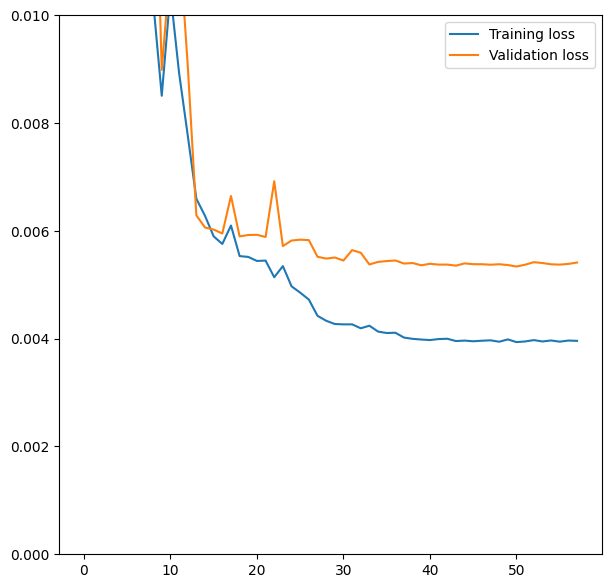

In [28]:
plt.figure(figsize=(7, 7))
plt.plot(history['train_loss'], label='Training loss')
plt.plot(history['val_loss'], label='Validation loss')
plt.ylim(0, 0.01)
plt.legend()
plt.show()

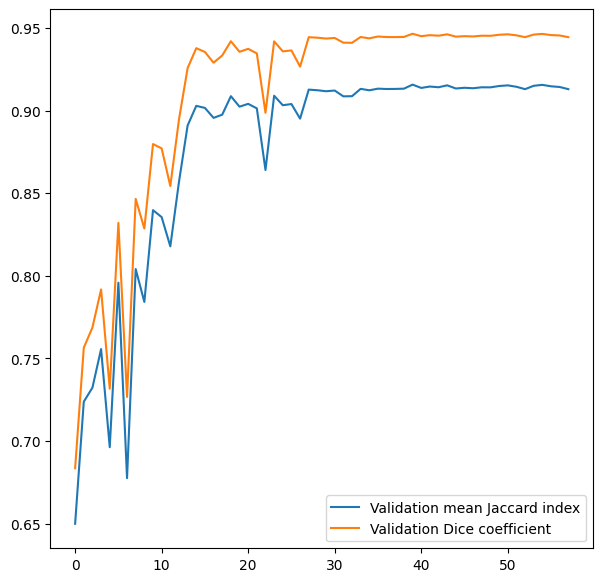

In [29]:
plt.figure(figsize=(7, 7))
plt.plot(history['val_IoU'], label='Validation mean Jaccard index')
plt.plot(history['val_dice'], label='Validation Dice coefficient')
plt.legend()
plt.show()

## Test Evaluation

In [30]:
with torch.no_grad():
    running_IoU = 0
    running_dice = 0
    running_loss = 0
    for i, data in enumerate(test_loader):
        img, mask = data
        img, mask = img.to(device), mask.to(device)
        predictions = model(img)
        predictions = predictions.squeeze(1)
        running_dice += dice_pytorch(predictions, mask).sum().item()
        running_IoU += iou_pytorch(predictions, mask).sum().item()
        loss = loss_fn(predictions, mask)
        running_loss += loss.item() * img.size(0)
    loss = running_loss / len(test_dataset)
    dice = running_dice / len(test_dataset)
    IoU = running_IoU / len(test_dataset)
    
    print(f'Tests: loss: {loss} | Mean IoU: {IoU} | Dice coefficient: {dice}')

Tests: loss: 0.006368422063289449 | Mean IoU: 0.8855288880137825 | Dice coefficient: 0.9101013066060148


# Testing

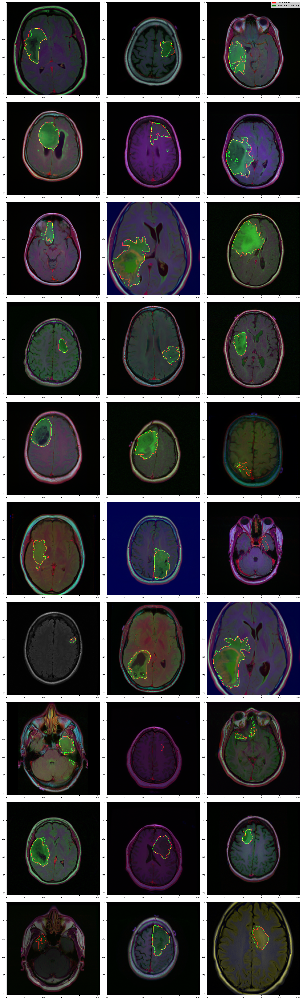

In [31]:
%matplotlib inline

width = 3
columns = 10
n_examples = columns * width

fig, axs = plt.subplots(columns, width, figsize=(7*width , 7*columns), constrained_layout=True)
red_patch = mpatches.Patch(color='red', label='The red data')
fig.legend(loc='upper right',handles=[
    mpatches.Patch(color='red', label='Ground truth'),
    mpatches.Patch(color='green', label='Predicted abnormality')])
i = 0
with torch.no_grad():
    for data in test_loader:
        image, mask = data
        mask = mask[0]
        if not mask.byte().any():
            continue
        image = image.to(device)
        prediction = model(image).to('cpu')[0][0]
        prediction = torch.where(prediction > 0.5, 1, 0)
        prediction_edges = prediction - binary_dilation(prediction)
        ground_truth = mask - binary_dilation(mask)
        image[0, 0, ground_truth.bool()] = 1
        image[0, 1, prediction_edges.bool()] = 1
        
        axs[i//width][i%width].imshow(image[0].to('cpu').permute(1, 2, 0))
        if n_examples == i + 1:
            break
        i += 1
